In [1]:
import cv2
import os
import numpy as np
import torch
import torchvision.transforms as T
from torchvision.models.segmentation import deeplabv3_resnet101
import matplotlib.pyplot as plt

원본 고양이 이미지 크기 : (1024, 1024, 3)
배경(사막) 이미지 크기 : (1024, 1536, 3)


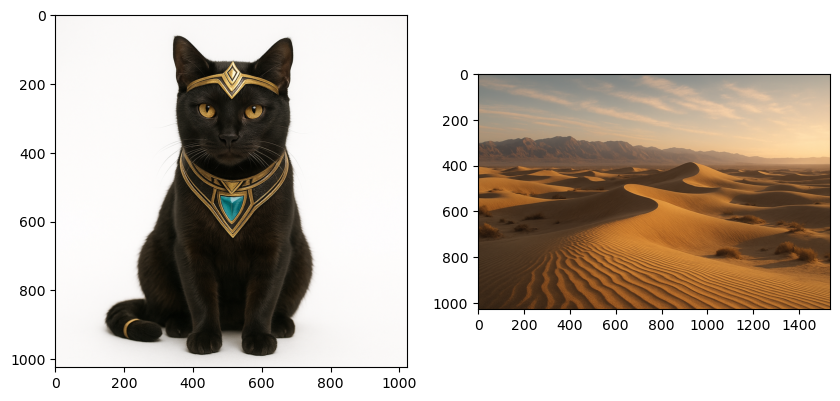

In [2]:
home_dir = os.getenv("HOME")
cat_img_path = os.path.join(home_dir,"work/cat.png")
sand_img_path = os.path.join(home_dir,"work/sand.png")

cat_img = cv2.imread(cat_img_path)
sand_img = cv2.imread(sand_img_path)

cat_img = cv2.cvtColor(cat_img, cv2.COLOR_BGR2RGB)
sand_img = cv2.cvtColor(sand_img, cv2.COLOR_BGR2RGB)

print(f"원본 고양이 이미지 크기 : {cat_img.shape}")
print(f"배경(사막) 이미지 크기 : {sand_img.shape}")

plt.figure(figsize = (10,5))
plt.subplot(1, 2, 1)
plt.imshow(cat_img)

plt.subplot(1, 2, 2)
plt.imshow(sand_img)

plt.show()

In [3]:
model = deeplabv3_resnet101(pretrained=True).eval()

transform = T.Compose([
    T.ToPILImage(),
    T.Resize((512,512)),
    T.ToTensor(),
])

input_tensor = transform(cat_img).unsqueeze(0)

with torch.no_grad():
    output = model(input_tensor)['out'][0]
    output_predictions = output.argmax(0).byte().cpu().numpy()

print(f"추론 마스크 크기 (Before Resize) : {output_predictions.shape}")

/opt/conda/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet101_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


추론 마스크 크기 (Before Resize) : (512, 512)


In [4]:
output_predictions_resized = cv2.resize(output_predictions, (cat_img.shape[1], cat_img.shape[0]),
                                      interpolation = cv2.INTER_NEAREST)

print(f"추론 마스크 크기 (After Resize): {output_predictions_resized.shape}")

추론 마스크 크기 (After Resize): (1024, 1024)


In [5]:
unique_classes = np.unique(output_predictions_resized)
print(f"예측된 클래스 ID: {unique_classes}")

예측된 클래스 ID: [0 8]


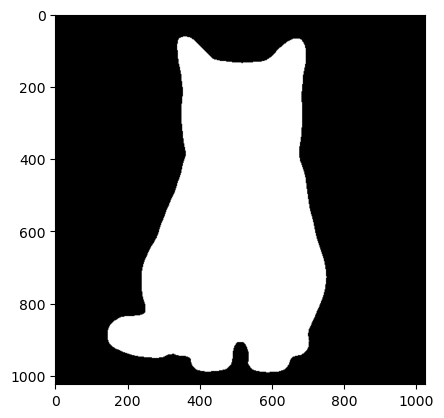

In [6]:
target_class_id = unique_classes [-1]

seg_map = (output_predictions_resized == target_class_id)
img_mask = seg_map.astype(np.uint8) * 255

plt.imshow(img_mask, cmap="gray")
plt.show()

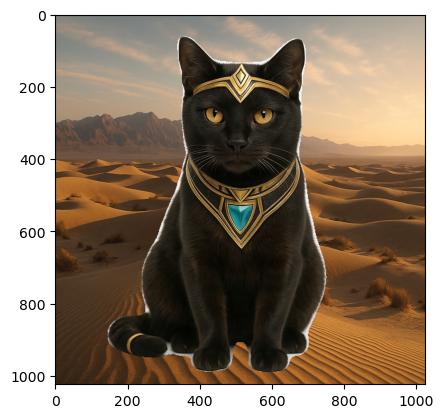

In [7]:
sand_img_resized = cv2.resize(sand_img, (cat_img.shape[1], cat_img.shape[0]))

img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
result_img = np.where(img_mask_color == 255, cat_img, sand_img_resized)

plt.imshow(result_img)
plt.show()

In [8]:
# 하나의 함수로 모듈화
def BackgroundFilter(obj_img, background_img=None, img_show=True, 
                     verbose=1, target=-1, background_process=None,
                     blur = 1, return_value=True):
    isBgObjSame = False
    obj_img = cv2.cvtColor(obj_img, cv2.COLOR_BGR2RGB)

    try:
        if background_img == None:
            background_img = obj_img.copy()
            isBgObjSame = True
    except:
        background_img = cv2.cvtColor(background_img, cv2.COLOR_BGR2RGB)
    
    LABEL_NAMES = [
        'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
        'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
        'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
    ]
    
    # verbose가 3 이상이고 img_show로 이미지를 보길 원할 때 재공
    if verbose >= 2 and img_show:
        print("object image / background image")
        plt.figure(figsize = (10,5))
        plt.subplot(1, 2, 1)
        plt.imshow(obj_img)
        
        plt.subplot(1, 2, 2)
        plt.imshow(background_img)
        plt.show()
        
    # verbose가 2 이상일 때 tracking log 재공
    if verbose >= 2:
        print(f"객체 이미지 크기 : {obj_img.shape}")
        print(f"배경 이미지 크기 : {background_img.shape}")
        
    model = deeplabv3_resnet101(pretrained=True).eval()

    transform = T.Compose([
        T.ToPILImage(),
        T.Resize((512,512)),
        T.ToTensor(),
    ])

    input_tensor = transform(obj_img).unsqueeze(0)

    with torch.no_grad():
        output = model(input_tensor)['out'][0]
        output_predictions = output.argmax(0).byte().cpu().numpy()
        
    # verbose가 2 이상일 때 tracking log 재공
    if verbose >= 3:
        print(f"추론 마스크 크기 (Before Resize) : {output_predictions.shape}")
        
    output_predictions_resized = cv2.resize(output_predictions, (obj_img.shape[1], obj_img.shape[0]),
                                      interpolation = cv2.INTER_NEAREST)
    
    unique_classes = np.unique(output_predictions_resized)

    unique_classes_str = [LABEL_NAMES[idx] for idx in unique_classes]
    
    # verbose가 1 이상일 때 tracking log 재공
    if verbose >= 1:
        print(f"예측된 클래스 ID: {unique_classes_str}")

    if isinstance(target, str):
        if np.isin(target, unique_classes_str):
            target_class_id = unique_classes[unique_classes_str.index(target)]
        else:
            raise Exception("Target is not valid")
        
    elif isinstance(target, int):
        target_class_id = unique_classes[target]
    else:
        raise Exception("Target input is not valid")

    seg_map = (output_predictions_resized == target_class_id)
    img_mask = seg_map.astype(np.uint8) * 255
    
    # verbose가 2 이상이고 img_show로 이미지를 보길 원할 때 재공
    if verbose >= 3 and img_show:
        print("mask")
        plt.imshow(img_mask, cmap="gray")
        plt.show()

    background_img_resized = cv2.resize(background_img, (obj_img.shape[1], obj_img.shape[0]))
    
    img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2RGB)
    result_img = np.where(img_mask_color == 255, obj_img, background_img_resized)
    
    # verbose가 4 이상이고 img_show로 이미지를 보길 원할 때 재공
    if verbose >= 4 and img_show:
        print("result image without background filter")
        plt.imshow(result_img)
        plt.show()

    if background_process == 0 or background_process == "blur":
        
        img_orig_blur = cv2.blur(result_img, (int(13 * (blur)),int(13 * (blur))))
        
        img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
    
        # cv2.bitwise_not(): 이미지가 반전. 흑백이미지의 흑백이 바뀜
        img_bg_mask = cv2.bitwise_not(img_mask_color)
        
        # cv2.bitwise_and(): 둘다 값이 있는것만 반영
        img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
        
        # verbose가 4 이상이고 img_show로 이미지를 보길 원할 때 재공
        if verbose >= 4 and img_show:
            print("background blur")
            plt.imshow(img_bg_blur)
            plt.show()
            
        result_img= np.where(img_mask_color == 255,result_img, img_bg_blur)
        
    elif background_process == 1 or background_process =="reverseBlur":

        img_orig_blur = cv2.blur(result_img, (int(13 * (blur)),int(13 * (blur))))

        img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)

        # cv2.bitwise_and(): 둘다 값이 있는것만 반영
        img_bg_blur = cv2.bitwise_and(img_orig_blur, img_mask_color)
        
        # verbose가 4 이상이고 img_show로 이미지를 보길 원할 때 재공
        if verbose >= 4 and img_show:
            print("object blur")
            plt.imshow(img_bg_blur)
            plt.show()
            
        result_img = np.where(img_mask_color == 255, img_orig_blur, result_img)
        
    elif background_process <= 0 or background_process == None:
        pass
    else:
        raise Exception("Background filter mode is not valid")

    # img_show로 이미지를 보길 원할 때 재공
    if img_show:
        plt.imshow(result_img)
        plt.show()

    if return_value:
        return result_img

예측된 클래스 ID: ['background', 'cat']


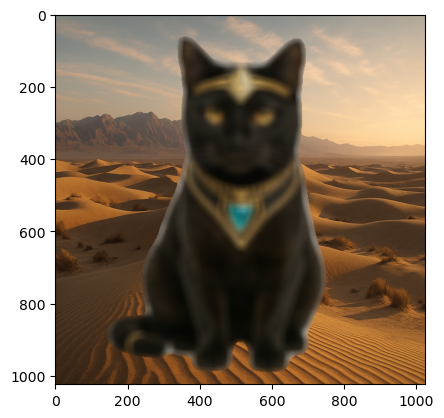

In [9]:
# 작동 확인 reverseBlur 일 경우
cat_img_path = os.path.join(home_dir,"work/cat.png")
sand_img_path = os.path.join(home_dir,"work/sand.png")

cat_img = cv2.imread(cat_img_path)
sand_img = cv2.imread(sand_img_path)

BackgroundFilter(cat_img, sand_img, background_process = 1, blur = 2, return_value=False)

예측된 클래스 ID: ['background', 'cat']


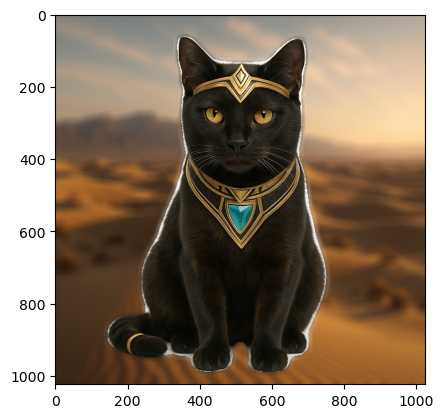

In [10]:
# 작동 확인 blur 일 경우
BackgroundFilter(cat_img, sand_img, background_process = 0, blur = 2, return_value=False)

In [11]:
# 0, 1, < 0 이거나 "blur", "reverseBlur", None 이외의 경우 오류가 나와야함
BackgroundFilter(cat_img, sand_img, background_process = 4, blur = 2, return_value=False)

예측된 클래스 ID: ['background', 'cat']


Exception: Background filter mode is not valid

예측된 클래스 ID: ['background', 'cat']


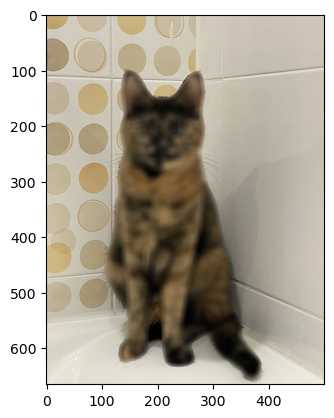

In [12]:
# bacground를 입력하지 않았을 경우 같은 이미지로 처리됨
cat_img_path3 = os.path.join(home_dir,"work/cat3.jpg")
cat_img3 = cv2.imread(cat_img_path3)

BackgroundFilter(cat_img3, background_process = 1, blur = 1, return_value=False)

예측된 클래스 ID: ['background', 'cat']


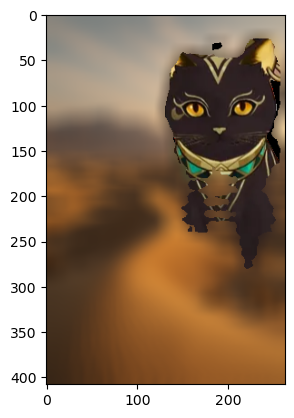

In [13]:
# 스타일이 달라지면 잘 감지하지 못함
cat_img_path2 = os.path.join(home_dir,"work/cat2.png")
cat_img2 = cv2.imread(cat_img_path2)

BackgroundFilter(cat_img2, sand_img, background_process = 0, blur = 2, return_value=False)

object image / background image


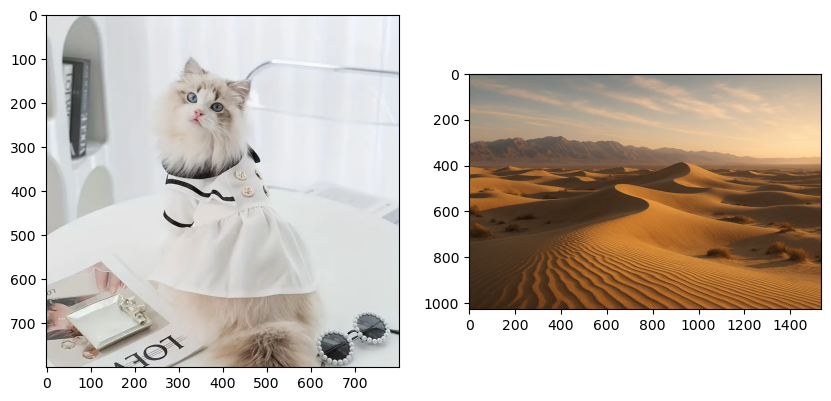

객체 이미지 크기 : (800, 800, 3)
배경 이미지 크기 : (1024, 1536, 3)
예측된 클래스 ID: ['background', 'cat']


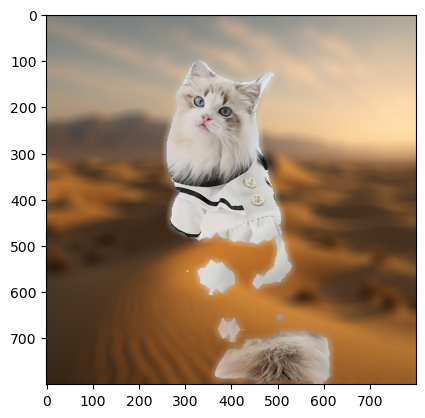

In [14]:
# class는 정확하게 분류했으나 고양이가가 옷을 입고 있어 잘 분리하지 못함
cat_img_path4 = os.path.join(home_dir,"work/cat4.webp")
cat_img4 = cv2.imread(cat_img_path4)

BackgroundFilter(cat_img4, sand_img, background_process = 0, blur = 2, return_value=False,verbose=2)

object image / background image


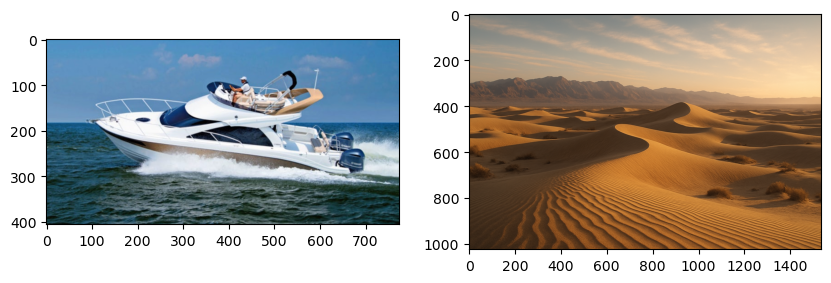

객체 이미지 크기 : (406, 773, 3)
배경 이미지 크기 : (1024, 1536, 3)
예측된 클래스 ID: ['background', 'aeroplane', 'boat', 'person']


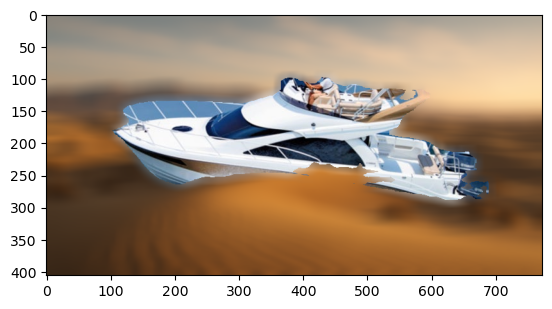

In [15]:
# target 지정 기능 기능 확인
# 물보라가 일어나는 부분을 잘 분리하지 못함
boat_img_path = os.path.join(home_dir,"work/boat.jpg")
boat_img = cv2.imread(boat_img_path)

BackgroundFilter(boat_img, sand_img, background_process = 0, blur = 2, return_value=False, target = 'boat', verbose=2)

object image / background image


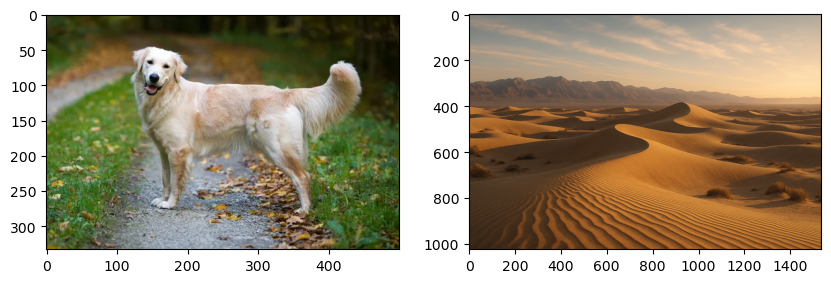

객체 이미지 크기 : (333, 500, 3)
배경 이미지 크기 : (1024, 1536, 3)
예측된 클래스 ID: ['background', 'dog']


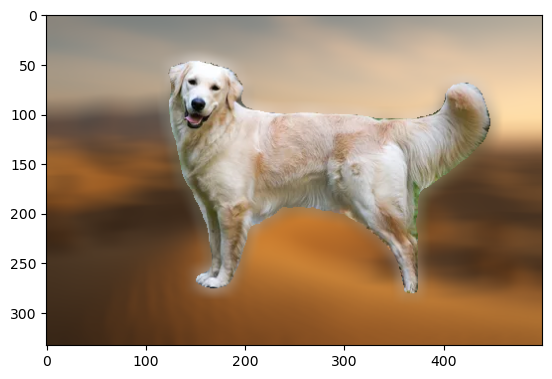

In [16]:
# 강아지 잘 분리하는지 확인
# 뒷발이 살짝 배경에 가려져서 뒷발이 약간 잘림
dog_img_path = os.path.join(home_dir,"work/dog.webp")
dog_img = cv2.imread(dog_img_path)

BackgroundFilter(dog_img, sand_img, background_process = 0, blur = 2, return_value=False,verbose=2)

object image / background image


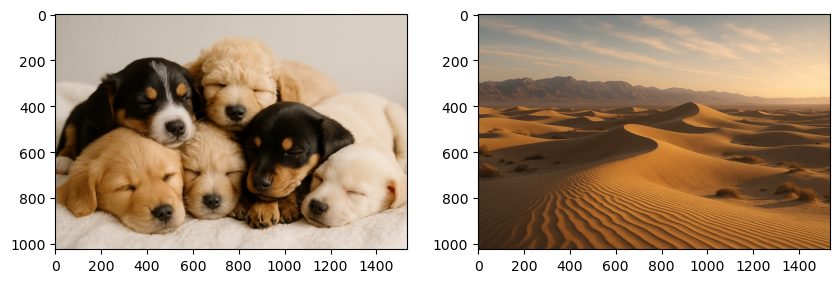

객체 이미지 크기 : (1024, 1536, 3)
배경 이미지 크기 : (1024, 1536, 3)
예측된 클래스 ID: ['background', 'dog']


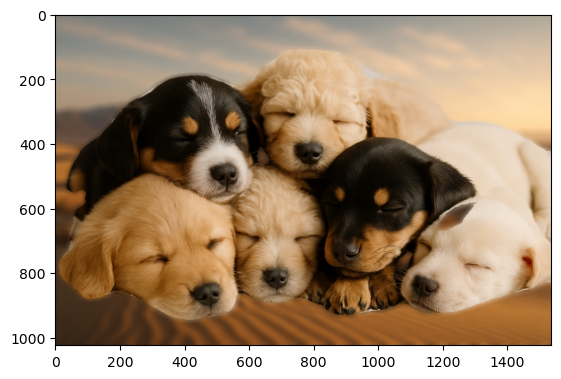

In [17]:
# 강아지들이 뭉쳐있을 경우 잘 분리해 내지 못함
dog_img_path2 = os.path.join(home_dir,"work/dog2.png")
dog_img2 = cv2.imread(dog_img_path2)

BackgroundFilter(dog_img2, sand_img, background_process = 0, blur = 2, return_value=False,verbose=2)

object image / background image


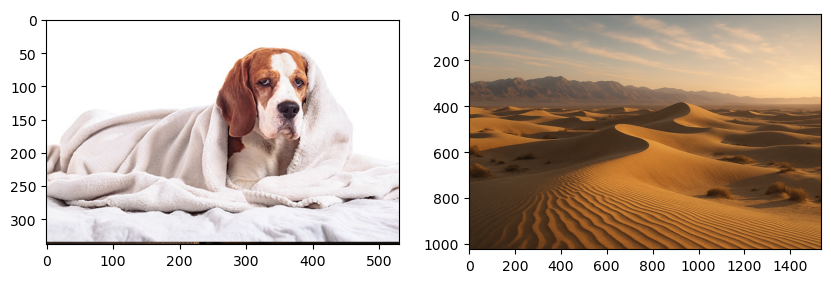

객체 이미지 크기 : (338, 530, 3)
배경 이미지 크기 : (1024, 1536, 3)
예측된 클래스 ID: ['background', 'dog']


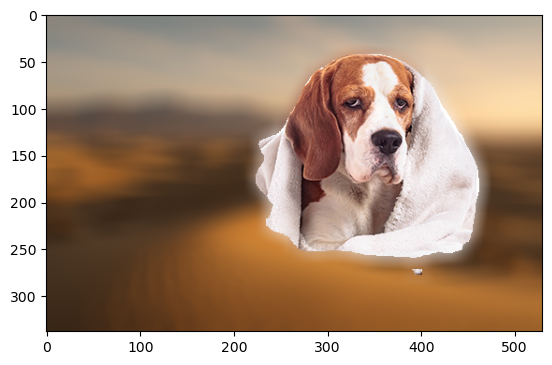

In [18]:
# 강아지가 가려져 있을 경우 강아지만 분리해야 하나 강아지와 같이 다른 부분들이 같이 분리됨
dog_img_path3 = os.path.join(home_dir,"work/dog3.jpg")
dog_img3 = cv2.imread(dog_img_path3)

BackgroundFilter(dog_img3, sand_img, background_process = 0, blur = 2, return_value=False,verbose=2)

object image / background image


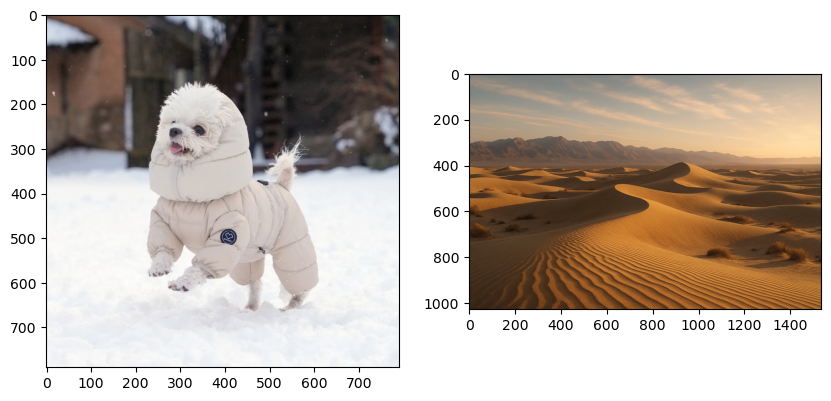

객체 이미지 크기 : (790, 790, 3)
배경 이미지 크기 : (1024, 1536, 3)
예측된 클래스 ID: ['background', 'person']


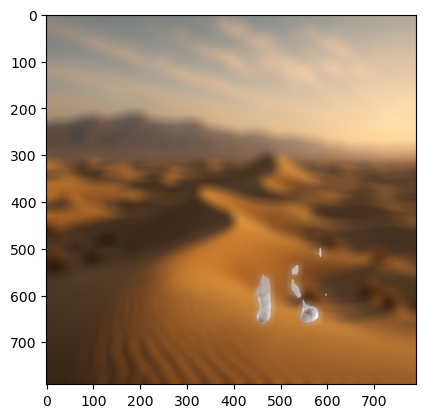

In [19]:
# class는 정확하게 분류했으나 강아지가 옷을 입고 있어 잘 분리하지 못함
dog_img_path4 = os.path.join(home_dir,"work/dog4.jpg")
dog_img4 = cv2.imread(dog_img_path4)

BackgroundFilter(dog_img4, sand_img, background_process = 0, blur = 2, return_value=False,verbose=2)

object image / background image


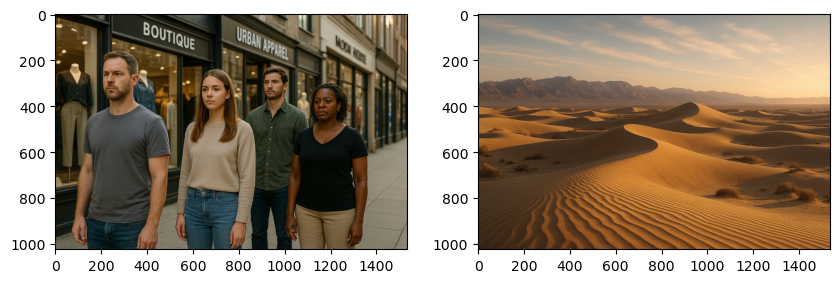

객체 이미지 크기 : (1024, 1536, 3)
배경 이미지 크기 : (1024, 1536, 3)
예측된 클래스 ID: ['background', 'person']


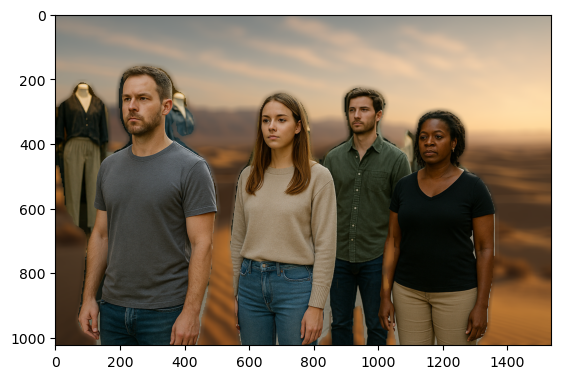

In [20]:
# class는 정확하게 분류했으나 배경에 있는 옷까지 분리해냄
person_img_path1 = os.path.join(home_dir,"work/person1.png")
person_img1 = cv2.imread(person_img_path1)

BackgroundFilter(person_img1, sand_img, background_process = 0, blur = 2, return_value=False,verbose=2)

object image / background image


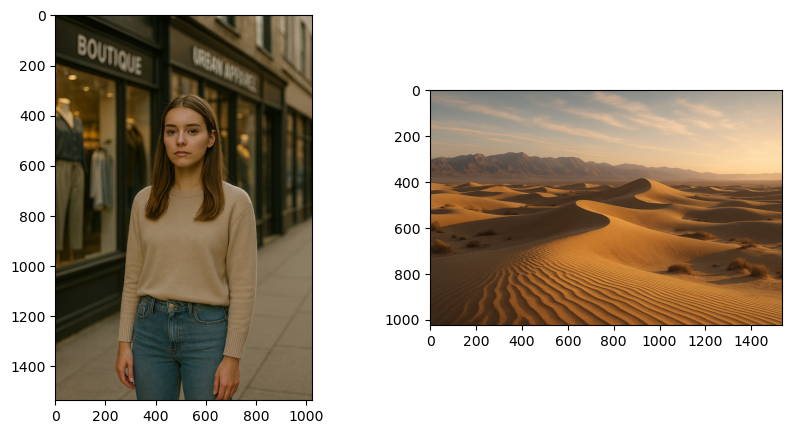

객체 이미지 크기 : (1536, 1024, 3)
배경 이미지 크기 : (1024, 1536, 3)
예측된 클래스 ID: ['background', 'person']


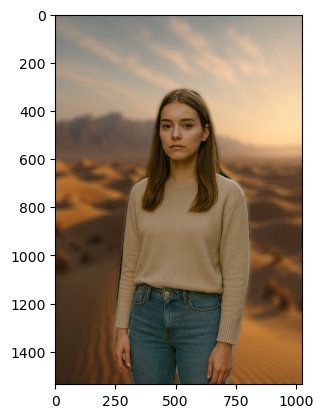

In [21]:
# class는 정확하게 분류했고 뒤의 옷과 햇갈리지 않음
person_img_path2 = os.path.join(home_dir,"work/person2.png")
person_img2 = cv2.imread(person_img_path2)

BackgroundFilter(person_img2, sand_img, background_process = 0, blur = 2, return_value=False,verbose=2)

object image / background image


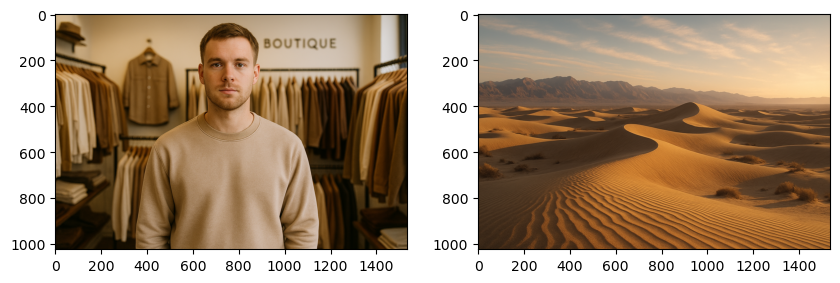

객체 이미지 크기 : (1024, 1536, 3)
배경 이미지 크기 : (1024, 1536, 3)
예측된 클래스 ID: ['background', 'person']


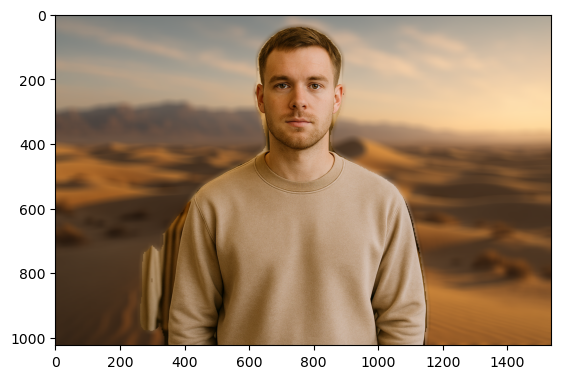

In [22]:
# class는 정확하게 분류했으나 옷까지 분리해냄
person_img_path3 = os.path.join(home_dir,"work/person3.png")
person_img3 = cv2.imread(person_img_path3)

BackgroundFilter(person_img3, sand_img, background_process = 0, blur = 2, return_value=False,verbose=2)

object image / background image


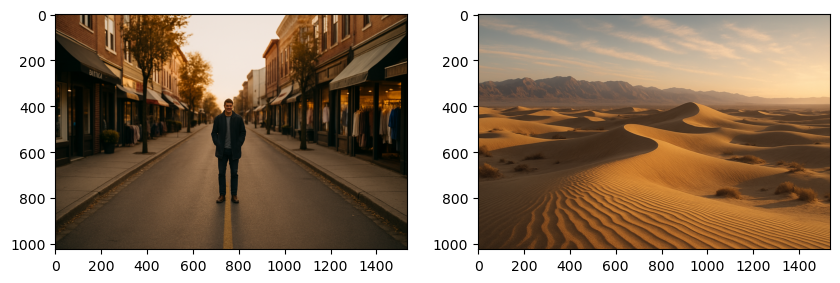

객체 이미지 크기 : (1024, 1536, 3)
배경 이미지 크기 : (1024, 1536, 3)
예측된 클래스 ID: ['background', 'person']


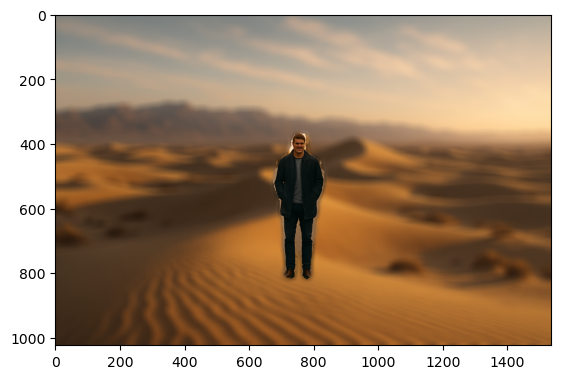

In [23]:
# 의외로 멀리있는 사람도 잘 분리
person_img_path4 = os.path.join(home_dir,"work/person4.png")
person_img4 = cv2.imread(person_img_path4)

BackgroundFilter(person_img4, sand_img, background_process = 0, blur = 2, return_value=False,verbose=2)

object image / background image


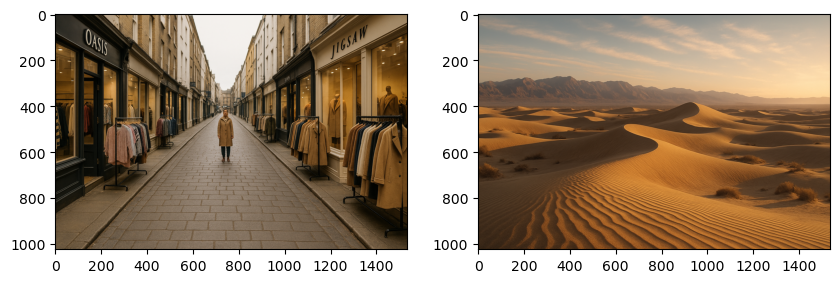

객체 이미지 크기 : (1024, 1536, 3)
배경 이미지 크기 : (1024, 1536, 3)
추론 마스크 크기 (Before Resize) : (512, 512)
예측된 클래스 ID: ['background', 'person']
mask


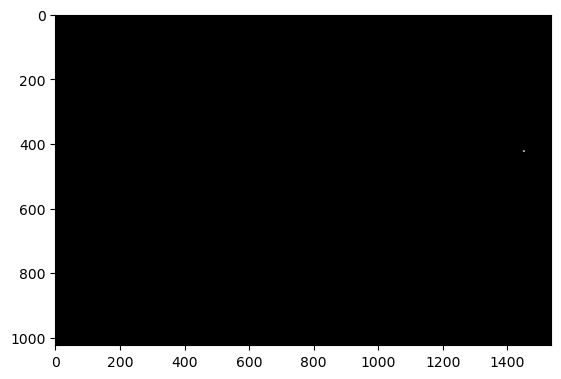

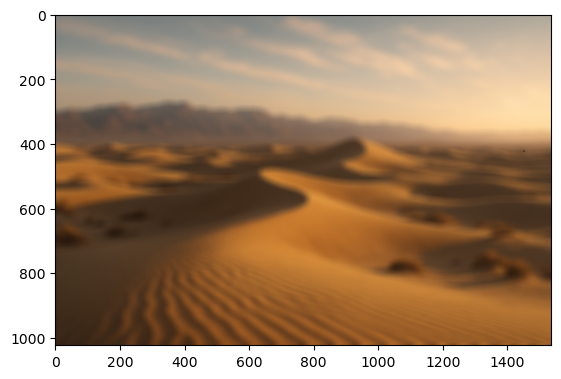

In [24]:
# class는 정확하게 분류했으나 분리하지 못함
person_img_path5 = os.path.join(home_dir,"work/person5.png")
person_img5 = cv2.imread(person_img_path5)

BackgroundFilter(person_img5, sand_img, background_process = 0, blur = 2, return_value=False,verbose=3)

object image / background image


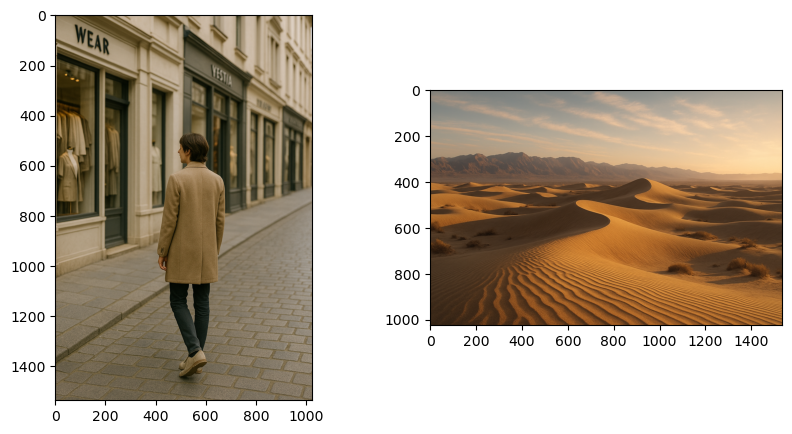

객체 이미지 크기 : (1536, 1024, 3)
배경 이미지 크기 : (1024, 1536, 3)
예측된 클래스 ID: ['background', 'person']


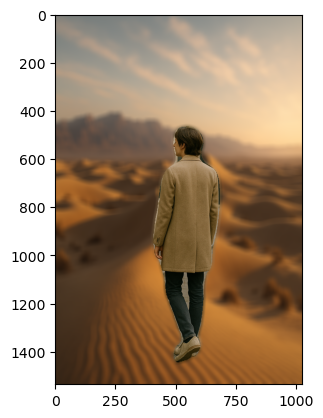

In [25]:
# 뒤돌아 있는 사람도 잘 분리
person_img_path6 = os.path.join(home_dir,"work/person6.png")
person_img6 = cv2.imread(person_img_path6)

BackgroundFilter(person_img6, sand_img, background_process = 0, blur = 2, return_value=False,verbose=2)

## 현재 모델의 segmentation의 문제점

사진의 문제점을 찾기 위하여 모듈화 한 함수의 verbose 를 3으로 지정하고 모든 이미지가 나오게 하여 하나하나 문제점을 찾아보겠습니다.

object image / background image


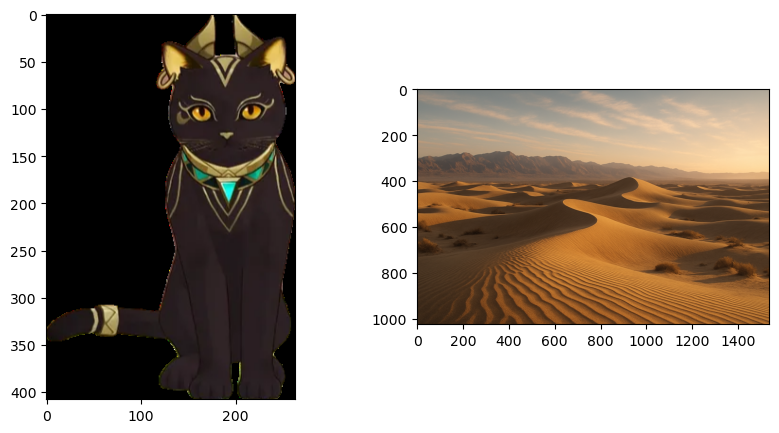

객체 이미지 크기 : (408, 263, 3)
배경 이미지 크기 : (1024, 1536, 3)
추론 마스크 크기 (Before Resize) : (512, 512)
예측된 클래스 ID: ['background', 'cat']
mask


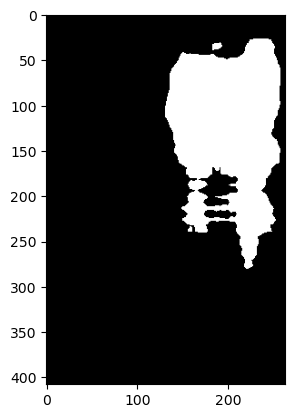

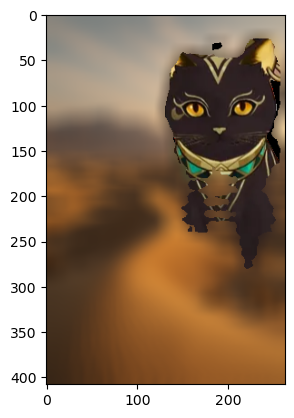

In [26]:
BackgroundFilter(cat_img2, sand_img, background_process = 0, blur = 2, return_value=False, verbose = 3)

위의 결과에서 mask를 보면 고양이임에도 불구하고 스타일이 바뀌었을 경우 잘 분리해내지 못하는것을 볼 수 있습니다. 또한, 이미지는 배경 없이 고양이 사진만이 있었을 뿐임에도 고양이를 잘 분리해내지 못했습니다.

이제 다른 class는 잘 분리하는 지 확인하겠습니다.

object image / background image


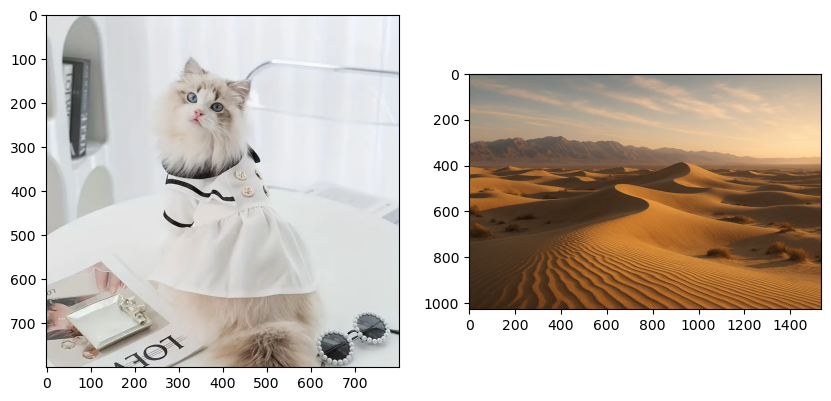

객체 이미지 크기 : (800, 800, 3)
배경 이미지 크기 : (1024, 1536, 3)
추론 마스크 크기 (Before Resize) : (512, 512)
예측된 클래스 ID: ['background', 'cat']
mask


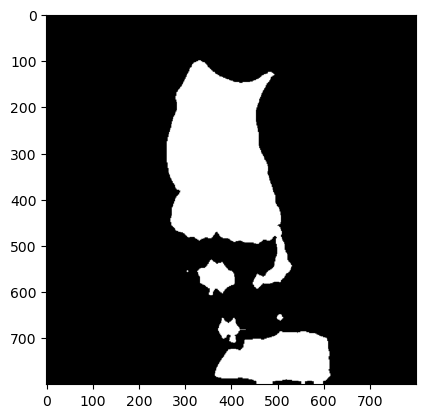

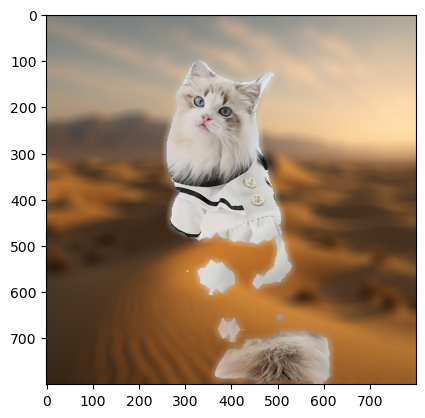

In [27]:
cat_img_path4 = os.path.join(home_dir,"work/cat4.webp")
cat_img4 = cv2.imread(cat_img_path4)

BackgroundFilter(cat_img4, sand_img, background_process = 0, blur = 2, return_value=False,verbose=3)

이번 사례의 경우에는 고양이가 옷을 입고 있었습니다. 하지만 옷을 입고있는 고양이는 흔하지 않죠. 따라서, 옷은 잘 구별하지 못하고 고양이만 분리해 낸 것을 볼 수 있습니다. 일부만 가려져 있는 경우에 어떻게 분리되는지 확인해 보겠습니다.

object image / background image


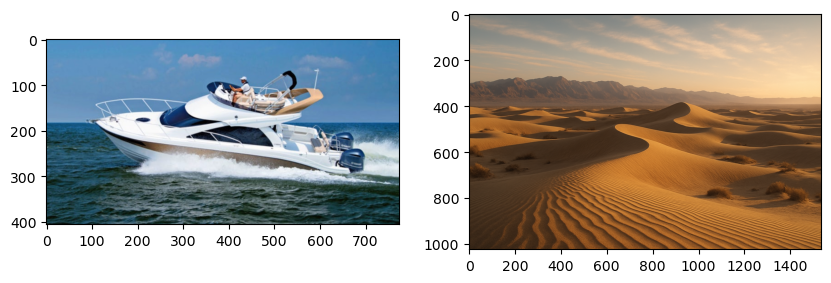

객체 이미지 크기 : (406, 773, 3)
배경 이미지 크기 : (1024, 1536, 3)
추론 마스크 크기 (Before Resize) : (512, 512)
예측된 클래스 ID: ['background', 'aeroplane', 'boat', 'person']
mask


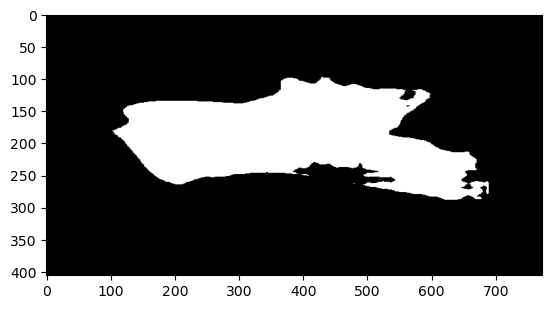

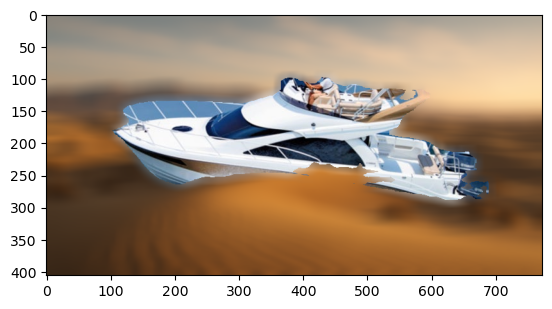

In [28]:
boat_img_path = os.path.join(home_dir,"work/boat.jpg")
boat_img = cv2.imread(boat_img_path)

BackgroundFilter(boat_img, sand_img, background_process = 0, blur = 2, return_value=False, target = 'boat',verbose=3)

이번에는 한 이미지에 여러 class가 검출되어 target을 boat로 지정하였습니다.

이 이미지는 물보라로 보트의 아래가 가려져 있었습니다. 모델은 boat를 잘 구별해 냈지만 물보라에대해서는 과하게 범위를 설정하였습니다. 이는, 중요한 부분이 잘릴 수 있다는 문제점을 보여줍니다.

다른 이미지로 옷에 이불을 뒤집어쓴 강아지 사진을 확인해 보겠습니다. 강아지는 거의 대부분이 옷에 가려져 있으며 강아지는 머리쪽만 나와있습니다. 모델은 이 이미지를 잘 구별해 낼 수 있을까요?

object image / background image


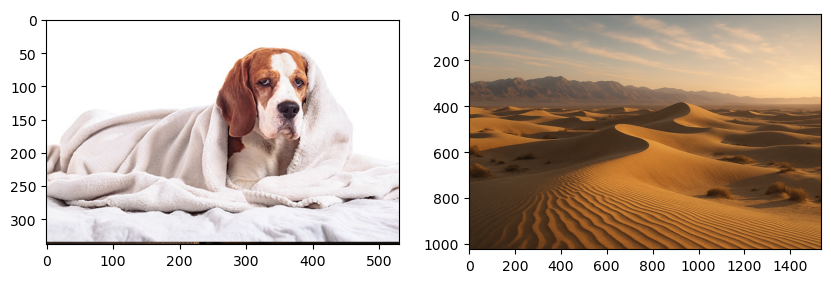

객체 이미지 크기 : (338, 530, 3)
배경 이미지 크기 : (1024, 1536, 3)
추론 마스크 크기 (Before Resize) : (512, 512)
예측된 클래스 ID: ['background', 'dog']
mask


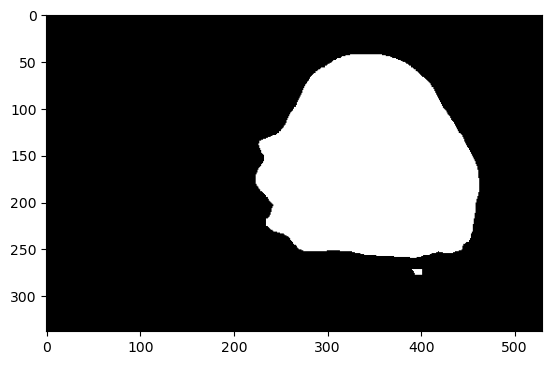

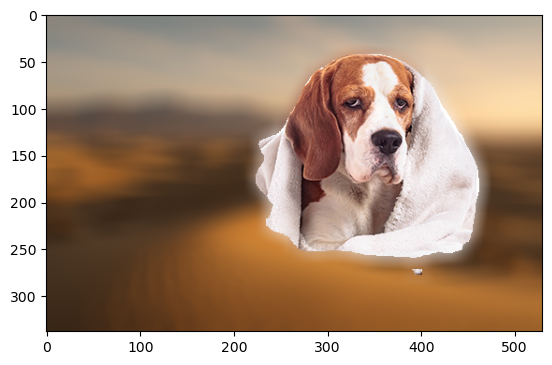

In [29]:
dog_img_path3 = os.path.join(home_dir,"work/dog3.jpg")
dog_img3 = cv2.imread(dog_img_path3)

BackgroundFilter(dog_img3, sand_img, background_process = 0, blur = 2, return_value=False,verbose=3)

이전 결과들과는 다르게 잘 구별해 냈습니다. 하지만 여전히 분리된 강아지의 이미지에 배경과 옷이 포함되어 있고 심지어는 분리되지 않아도 되는 부분이 아주 작지만 분리되었습니다. 이런 오류가 크게 나타날 경우 큰 문제가 될 수 있습니다.

다른 문제점으로는 target이 되는 객체가 뭉쳐있는 경우를 보겠습니다.

object image / background image


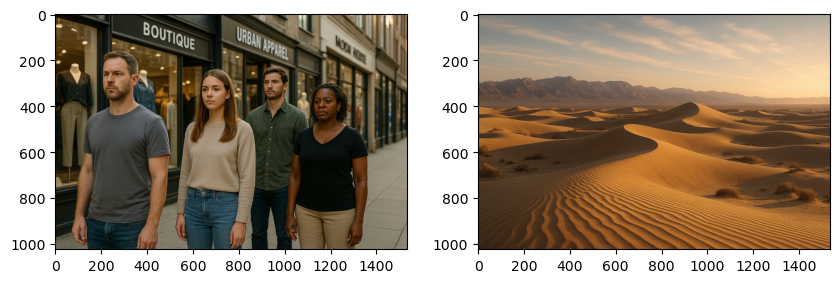

객체 이미지 크기 : (1024, 1536, 3)
배경 이미지 크기 : (1024, 1536, 3)
추론 마스크 크기 (Before Resize) : (512, 512)
예측된 클래스 ID: ['background', 'person']
mask


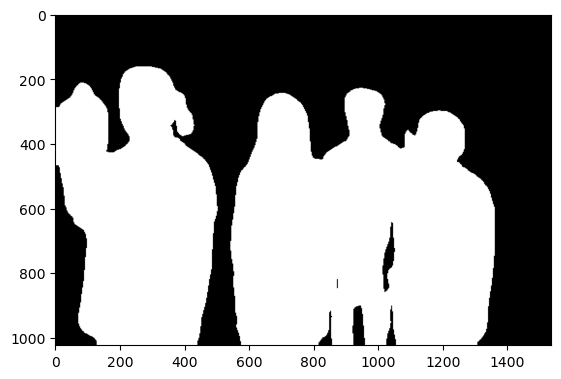

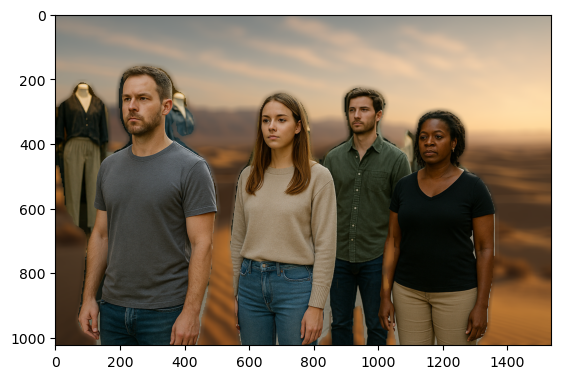

In [30]:
person_img_path1 = os.path.join(home_dir,"work/person1.png")
person_img1 = cv2.imread(person_img_path1)

BackgroundFilter(person_img1, sand_img, background_process = 0, blur = 2, return_value=False,verbose=3)

여러 인물이 있음에도 모델이 잘 분리해 낸 것을 볼 수 있습니다. 하지만, 인물과 같이 뒤에 있는 마내킹 까지 분리해 냈습니다. 이는 사람과 비슷해 보이는 형상을 잘 구분하지 못한다는 의미로 해석될 수 있습니다. 즉, 뒷배경이 분리되지 않고 남아 있을 수 도 있다는 것입니다. 이 또한 큰 문제가 될 수 있습니다. 그리고 거리가 먼 곳에 있는 마내킹은 이상하게 잘렸습니다. 지금 확인해 봐야 할 것은 2가지 입니다.


- 사람과 비슷한 형체에 따른 segmantation
- 거리에 따른 segmentatation

가장 먼저 옷이 가득한 곳에 있는 사람이 어떻게 분리되는 지 보겠습니다.

object image / background image


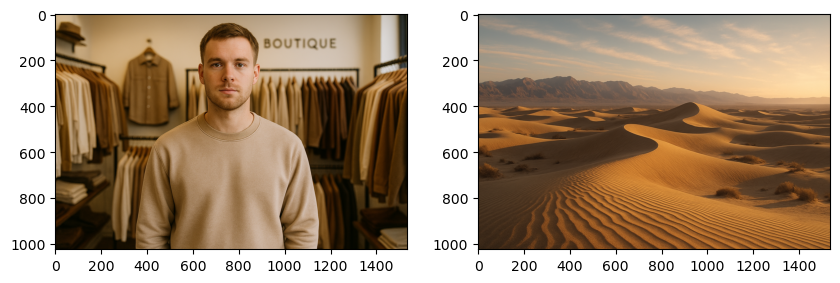

객체 이미지 크기 : (1024, 1536, 3)
배경 이미지 크기 : (1024, 1536, 3)
추론 마스크 크기 (Before Resize) : (512, 512)
예측된 클래스 ID: ['background', 'person']
mask


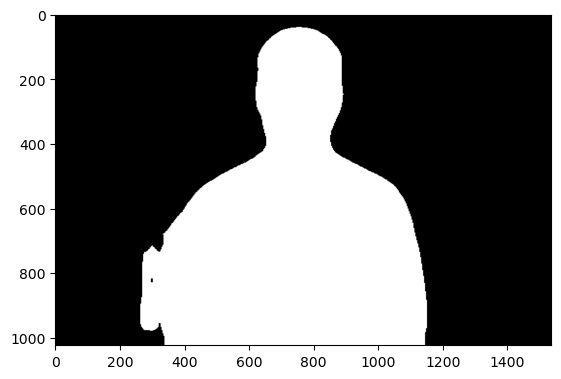

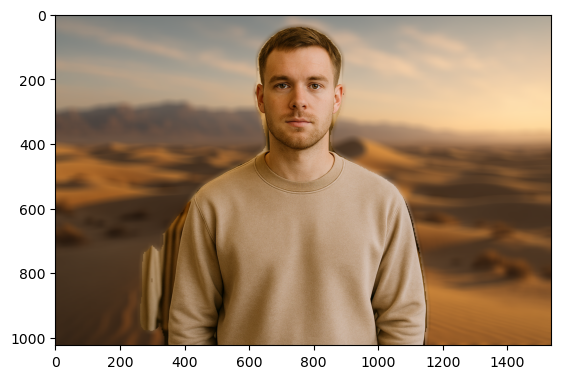

In [31]:
person_img_path3 = os.path.join(home_dir,"work/person3.png")
person_img3 = cv2.imread(person_img_path3)

BackgroundFilter(person_img3, sand_img, background_process = 0, blur = 2, return_value=False,verbose=3)

예상대로 사람과 비슷한 형채 이거나 분리하는 대상과 비슷한 색인 경우 이상하게 분리하는 것을 볼 수 있습니다. 또한, depth가 다름에도 불구하고 뒤의 옷이 같이 분리 되었습니다. 이는 위에서 파악한 문제에 새롭게 파악된 문제 입니다.

다음으로는 멀리 있는 대상은 잘 분리해 내는지 보겠습니다. 이번 이미지는 조금 복잡한 이미지를 사용해 보겠습니다.

object image / background image


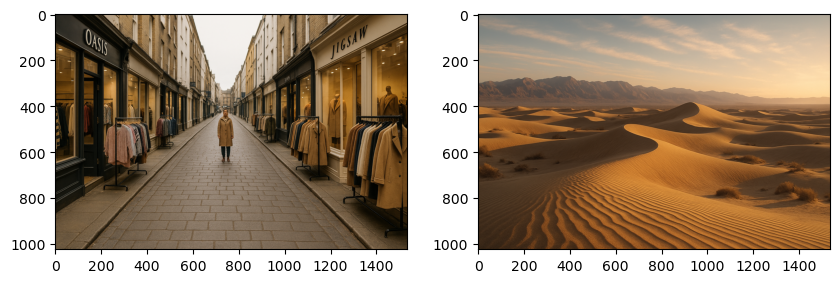

객체 이미지 크기 : (1024, 1536, 3)
배경 이미지 크기 : (1024, 1536, 3)
추론 마스크 크기 (Before Resize) : (512, 512)
예측된 클래스 ID: ['background', 'person']
mask


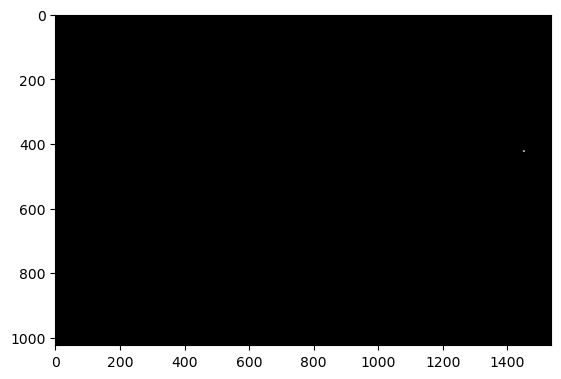

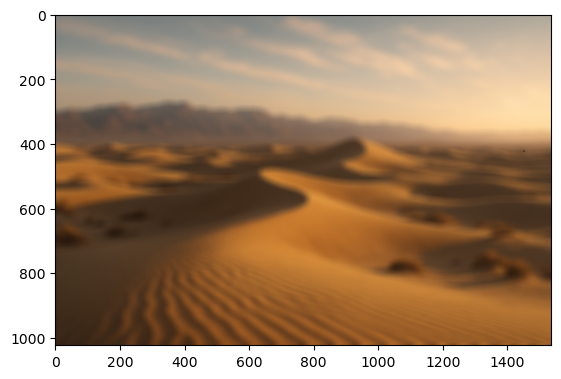

In [32]:
person_img_path5 = os.path.join(home_dir,"work/person5.png")
person_img5 = cv2.imread(person_img_path5)

BackgroundFilter(person_img5, sand_img, background_process = 0, blur = 2, return_value=False,verbose=3)

해당 이미지의 class는 정확하게 예측했으나 모델이 이미지가 복잡하여 잘 구별해 내지 못합니다. 이것은 사람이 멀어서 나온 오류이기도 하지만 주변 환경이 사람과 비슷한 형상이 있어서 나온 현상일 수 도 있습니다. 하지만 여기서는 거리에 따른 영향으로 보겠습니다.

지금까지 나온 문제점을 정리하면 다음과 같습니다.

- style에 따라서 segmentation이 달라짐
- 학습이 되지 않은 데이터에 대해 잘 예측하지 못함.
- 배경 또는 객체를 과도하게 segmentation하는 경향성이 있음
- 비슷한 형상의 객체들이 뭉쳐 있을 경우 depth가 다름에도 불구하고 원하는 객체가 비슷한 형상의 객체와 같이 segmentation 됨
- 멀리 있는 경우 mask를 찾지 못하여 segmantation을 잘 하지 못함

## 해결 방안

가장 첫번째로 재시된 문제를 보면 이미지에서의 depth를 잘 파악하지 못한다는 문제가 있었습니다. 이는 3차원에서 2차원으로 표현하면서 정보의 손실이 발생하는데 그 부분을 복원하는 것이 잘 안되는 것을 볼 수 있습니다. 따라서 depth를 잘 판단하기 위하여 다른 기술들을 이용해 depth에 대한 정보를 받아 올 수 있습니다. 2차원 이미지에서 depth를 복원 할 수도 있고, 적외선같은 다른 도구를 이용해서 depth를 받아 올 수도 있습니다. 관련된 몇몇 기술들을 정리해 보면 아래와 같습니다.

- D-ToF
- uDepth
- struct2depth
- Depth Anything V2
- Marigold
- Metric3D v2
- UniDepth
- DepthCrafter
- FlashDepth

이 부분에서 모델의 archtecture를 바꿔 볼 수도 있습니다. 가장 유명한 방법론 중 하나는 ViT를 이용한 segmentation을 보여준 SAM2 였습니다. 정리하면 아래와 같습니다.

- Mask2Former
- OneFormer
- Mask DINO
- ViT-Adapter
- ViT-CoMer

Style에 따른 문제와 학습이 되지 않은 데이터는 모델 구조를 바꾸거나 데이터를 추가 학습하여 해결 할 수 있습니다. 특히, ViT 같이 query를 여러개 조합하여 스스로 가장 좋은 해법을 찾는 archtecture는 이러한 문제에서 오차율을 줄일 수 있습니다. 이는 멀리 있을 경우의 문제와 과도하게 segmentation하는 문제 또한 어느정도는 해결 할 수 있습니다.